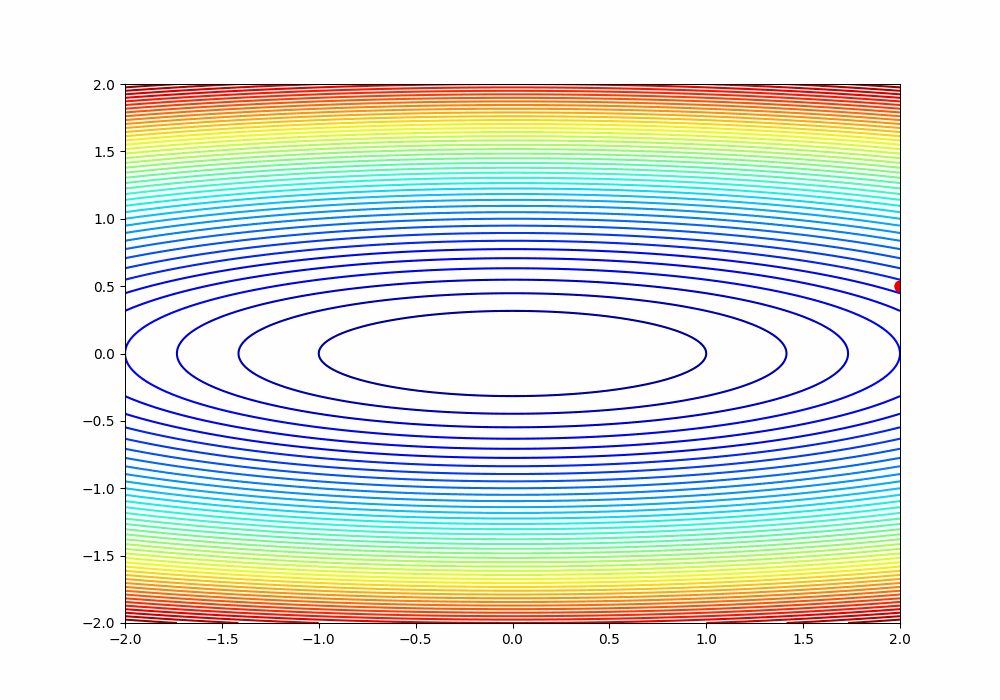

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import display, Image

# Quadratic function and its gradient
def f(x, y, a=1, b=50):
    return a*x**2 + b*y**2

def gradient(x, y, a=1, b=50):
    return np.array([2*a*x, 2*b*y])

# Gradient descent
def gradient_descent(learning_rate=0.01, num_iterations=100, a=1, b=50):
    history = []
    point = np.array([2, 0.5])  # starting point
    for _ in range(num_iterations):
        history.append(point.copy())
        point -= learning_rate * gradient(point[0], point[1], a, b)
    return np.array(history)

# Visualization
def visualize_gd(history, a=1, b=10):
    fig, ax = plt.subplots(figsize=(10, 7))
    x = np.linspace(-2.0, 2.0, 400)
    y = np.linspace(-2.0, 2.0, 400)
    X, Y = np.meshgrid(x, y)
    Z = f(X, Y, a, b)
    
    ax.contour(X, Y, Z, 50, cmap='jet')
    line, = ax.plot([], [], 'ro-', markersize=8, lw=2)
    
    def init():
        line.set_data([], [])
        return line,
    
    def animate(i):
        line.set_data(history[:i+1, 0], history[:i+1, 1])
        return line,

    ani = animation.FuncAnimation(fig, animate, init_func=init, frames=len(history), blit=True)
    ani.save('gradient_descent.gif', writer='pillow', fps=10)
    plt.close(fig)

# Main function
if __name__ == "__main__":
    history = gradient_descent(learning_rate=0.1, num_iterations=100, a=1, b=10)
    visualize_gd(history)
    with open("gradient_descent.gif", "rb") as gif:
        display(Image(data=gif.read(), format="png"))


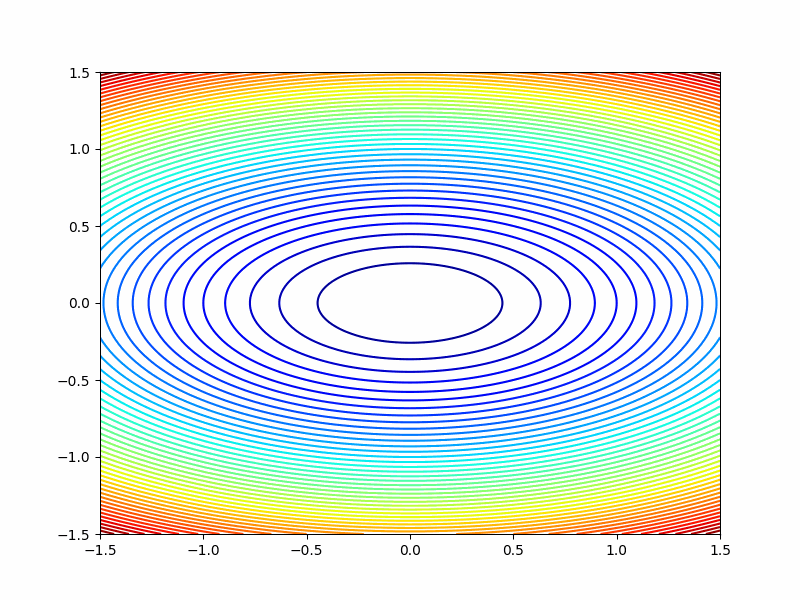

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Define the 2D quadratic function and its gradient
def quadratic(x, A):
    return 0.5 * x.T @ A @ x

def gradient(x, A):
    return A @ x

# Gradient Descent without Line Search
def gd_no_line_search(A, x_init, lr=0.01, num_iterations=100):
    x = x_init
    history = [x]
    for _ in range(num_iterations):
        x = x - lr * gradient(x, A)
        history.append(x.copy())
    return np.array(history)

# Gradient Descent with Line Search
def gd_with_line_search(A, x_init, num_iterations=100):
    x = x_init
    history = [x]
    for _ in range(num_iterations):
        grad = gradient(x, A)
        alpha = grad.T @ grad / (grad.T @ A @ grad)  # Optimal step size
        x = x - alpha * grad
        history.append(x.copy())
    return np.array(history)

# Generate the GIF
def generate_gif(histories, A, labels):
    fig, ax = plt.subplots(figsize=(8, 6))
    
    x_vals = np.linspace(-1.5, 1.5, 400)
    y_vals = np.linspace(-1.5, 1.5, 400)
    X, Y = np.meshgrid(x_vals, y_vals)
    Z = np.zeros_like(X)
    
    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            Z[i, j] = quadratic(np.array([X[i, j], Y[i, j]]), A)

    ax.contour(X, Y, Z, 50, cmap='jet')

    lines = [ax.plot([], [], label=lbl)[0] for lbl in labels]

    def init():
        for line in lines:
            line.set_data([], [])
        return lines

    def animate(i):
        for line, history in zip(lines, histories):
            line.set_data(history[:i, 0], history[:i, 1])
        return lines

    ani = animation.FuncAnimation(fig, animate, init_func=init, frames=len(histories[0]), blit=True)
    ani.save('comparison.gif', writer='pillow', fps=5)
    plt.legend()
    plt.close(fig)

# Define the matrix for the 2D quadratic function
A = np.array([[1, 0], [0, 3]])
x_init = np.array([1.4, 1.4])

history_no_ls = gd_no_line_search(A, x_init)
history_with_ls = gd_with_line_search(A, x_init)

generate_gif([history_no_ls, history_with_ls], A, ["No Line Search", "With Line Search"])
with open("comparison.gif", "rb") as gif:
        display(Image(data=gif.read(), format="png"))

/tmp/ipykernel_38/3027064444.py:10: RuntimeWarning: overflow encountered in double_scalars
  dfdx = 4 * x[0] * (x[0]**2 + x[1] - 11) + 2 * (x[0] + x[1]**2 - 7)
/tmp/ipykernel_38/3027064444.py:11: RuntimeWarning: overflow encountered in double_scalars
  dfdy = 2 * (x[0]**2 + x[1] - 11) + 4 * x[1] * (x[0] + x[1]**2 - 7)
/tmp/ipykernel_38/3027064444.py:29: RuntimeWarning: invalid value encountered in double_scalars
  alpha = grad.T @ grad / np.linalg.norm(grad)**2


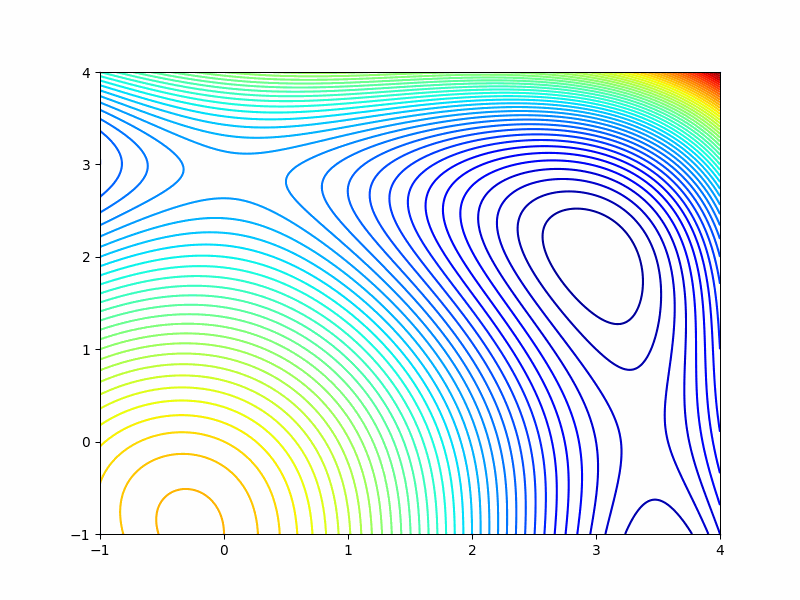

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Himmelblau function and its gradient
def himmelblau(x):
    return (x[0]**2 + x[1] - 11)**2 + (x[0] + x[1]**2 - 7)**2

def gradient_himmelblau(x):
    dfdx = 4 * x[0] * (x[0]**2 + x[1] - 11) + 2 * (x[0] + x[1]**2 - 7)
    dfdy = 2 * (x[0]**2 + x[1] - 11) + 4 * x[1] * (x[0] + x[1]**2 - 7)
    return np.array([dfdx, dfdy])

# Gradient Descent without Line Search
def gd_no_line_search(x_init, lr=0.01, num_iterations=100):
    x = x_init
    history = [x]
    for _ in range(num_iterations):
        x = x - lr * gradient_himmelblau(x)
        history.append(x.copy())
    return np.array(history)

# Gradient Descent with Line Search
def gd_with_line_search(x_init, num_iterations=100):
    x = x_init
    history = [x]
    for _ in range(num_iterations):
        grad = gradient_himmelblau(x)
        alpha = grad.T @ grad / np.linalg.norm(grad)**2
        x = x - alpha * grad
        history.append(x.copy())
    return np.array(history)

# Generate the GIF
def generate_gif(histories, labels):
    fig, ax = plt.subplots(figsize=(8, 6))
    
    x_vals = np.linspace(-1, 4, 400)
    y_vals = np.linspace(-1, 4, 400)
    X, Y = np.meshgrid(x_vals, y_vals)
    Z = np.zeros_like(X)
    
    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            Z[i, j] = himmelblau(np.array([X[i, j], Y[i, j]]))

    ax.contour(X, Y, Z, 50, cmap='jet')

    lines = [ax.plot([], [], label=lbl)[0] for lbl in labels]

    def init():
        for line in lines:
            line.set_data([], [])
        return lines

    def animate(i):
        for line, history in zip(lines, histories):
            line.set_data(history[:i, 0], history[:i, 1])
        return lines

    ani = animation.FuncAnimation(fig, animate, init_func=init, frames=len(histories[0]), blit=True)
    ani.save('nonconvex_comparison.gif', writer='pillow', fps=5)
    plt.legend()
    plt.close(fig)

# Start point
x_init = np.array([0, 0])

history_no_ls = gd_no_line_search(x_init, lr=0.01, num_iterations=100)
history_with_ls = gd_with_line_search(x_init, num_iterations=100)

generate_gif([history_no_ls, history_with_ls], ["No Line Search", "With Line Search"])
with open("nonconvex_comparison.gif", "rb") as gif:
        display(Image(data=gif.read(), format="png"))

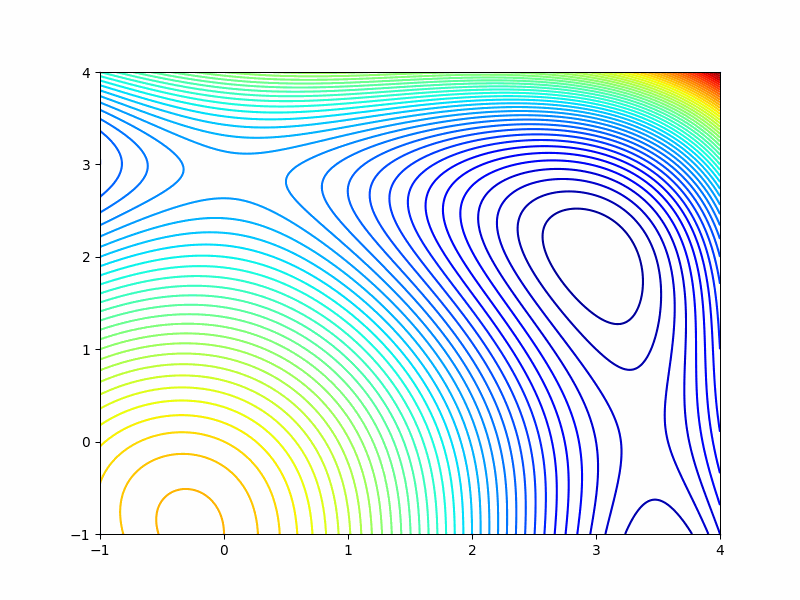

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Himmelblau function and its gradient
def himmelblau(x):
    return (x[0]**2 + x[1] - 11)**2 + (x[0] + x[1]**2 - 7)**2

def gradient_himmelblau(x):
    dfdx = 4 * x[0] * (x[0]**2 + x[1] - 11) + 2 * (x[0] + x[1]**2 - 7)
    dfdy = 2 * (x[0]**2 + x[1] - 11) + 4 * x[1] * (x[0] + x[1]**2 - 7)
    return np.array([dfdx, dfdy])

# Gradient Descent without Line Search
def gd_no_line_search(x_init, lr=0.01, num_iterations=100):
    x = x_init
    history = [x]
    for _ in range(num_iterations):
        x = x - lr * gradient_himmelblau(x)
        history.append(x.copy())
    return np.array(history)

# Gradient Descent with Armijo Line Search
def gd_armijo_line_search(x_init, alpha=0.1, beta=0.7, num_iterations=100):
    x = x_init
    history = [x]
    for _ in range(num_iterations):
        grad = gradient_himmelblau(x)
        t = 1
        while himmelblau(x - t * grad) > himmelblau(x) - alpha * t * np.dot(grad, grad):
            t = beta * t
        x = x - t * grad
        history.append(x.copy())
    return np.array(history)

# ... [The generate_gif function remains unchanged]

# Start point
x_init = np.array([0, 0])

history_no_ls = gd_no_line_search(x_init, lr=0.01, num_iterations=100)
history_armijo = gd_armijo_line_search(x_init, alpha=0.1, beta=0.7, num_iterations=100)

generate_gif([history_no_ls, history_armijo], ["No Line Search", "Armijo Line Search"])
with open("nonconvex_comparison.gif", "rb") as gif:
        display(Image(data=gif.read(), format="png"))


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=59115d46-a419-43f9-a3fe-b160aca2a335' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>